# Bayesian Active Learning

NOTES:

- Do I need indexes in BALD_query?
    - For now logit shape is hard coded.

In [3]:
import os
os.chdir('/Users/madsbirch/Documents/bal')
print("Current working directory: {0}".format(os.getcwd()))

# OPTIONAL: Load the "autoreload" extension so that code can change
%load_ext autoreload
%autoreload 2

Current working directory: /Users/madsbirch/Documents/bal
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [4]:
import time 
import random
import numpy as np
import matplotlib.pyplot as plt
#import seaborn as sns
from sklearn.datasets import make_moons, make_circles, make_classification
from matplotlib.colors import ListedColormap
from mpl_toolkits.axes_grid1 import make_axes_locatable
from sklearn.model_selection import train_test_split

import pickle

import torch
import torchvision
import torchvision.transforms as transforms

import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import DataLoader, random_split, SubsetRandomSampler
from torch.utils.data import DataLoader, Subset


from src.models.model import MLP
from src.data.data import get_dataloaders, TwoMoons
from src.models.train_model import train, test

torch.manual_seed(0)
np.random.seed(1)
random.seed(0)

# Set device
device = "mps" if torch.backends.mps.is_available() else "cpu"
device = 'cpu'
print(f"Using device: {device}")

FIGURE_PATH = '/Users/madsbirch/Documents/4_semester/BAL/bayesian-active-learning/reports/figures/'

Using device: cpu


### Define data, data loaders & training parameters

In [5]:
from src.data.data import MNIST_CUSTOM
traindata = MNIST_CUSTOM(root='data/raw', train = True)

In [4]:
import numpy as np
np.arange(100, 1100, step=100)
np.linspace(100, 1000, 10, dtype = int)

array([ 100,  200,  300,  400,  500,  600,  700,  800,  900, 1000])

In [5]:
sub = Subset(traindata, [1,2,3])
dl = DataLoader(sub)

Epoch:   0 | Train Loss: 2.27 | Train Acc: 33.3%
Epoch:   1 | Train Loss: 2.04 | Train Acc: 0.0%
Epoch:   2 | Train Loss: 1.48 | Train Acc: 100.0%
Epoch:   3 | Train Loss: 1.02 | Train Acc: 100.0%
Epoch:   4 | Train Loss: 0.96 | Train Acc: 66.7%
Epoch:   5 | Train Loss: 0.98 | Train Acc: 33.3%
Epoch:   6 | Train Loss: 0.32 | Train Acc: 100.0%
Epoch:   7 | Train Loss: 0.05 | Train Acc: 100.0%
Epoch:   8 | Train Loss: 0.16 | Train Acc: 100.0%
Epoch:   9 | Train Loss: 0.02 | Train Acc: 100.0%
Epoch:  10 | Train Loss: 0.11 | Train Acc: 100.0%
Epoch:  11 | Train Loss: 0.05 | Train Acc: 100.0%
Epoch:  12 | Train Loss: 0.01 | Train Acc: 100.0%
Epoch:  13 | Train Loss: 0.11 | Train Acc: 100.0%
Epoch:  14 | Train Loss: 0.00 | Train Acc: 100.0%
Epoch:  15 | Train Loss: 0.00 | Train Acc: 100.0%
Epoch:  16 | Train Loss: 0.00 | Train Acc: 100.0%
Epoch:  17 | Train Loss: 0.00 | Train Acc: 100.0%
Epoch:  18 | Train Loss: 0.00 | Train Acc: 100.0%
Epoch:  19 | Train Loss: 0.00 | Train Acc: 100.0%
Epoch

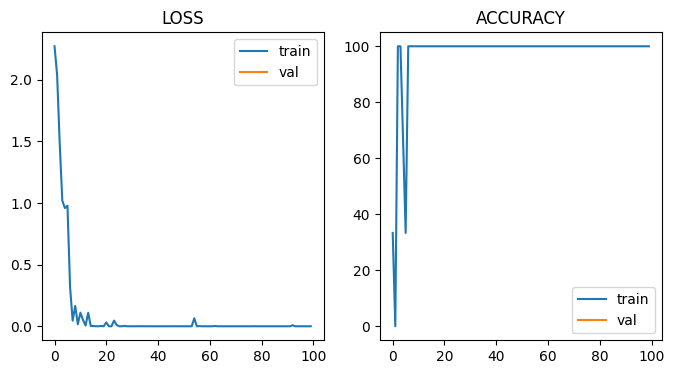

(PaperCNN(
   (conv): Sequential(
     (0): Conv2d(1, 32, kernel_size=(4, 4), stride=(1, 1))
     (1): ReLU()
     (2): Conv2d(32, 32, kernel_size=(4, 4), stride=(1, 1))
     (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
     (4): Dropout2d(p=0.25, inplace=False)
   )
   (lin): Sequential(
     (0): Linear(in_features=3872, out_features=128, bias=True)
     (1): ReLU()
     (2): Dropout(p=0.5, inplace=False)
     (3): Linear(in_features=128, out_features=10, bias=True)
   )
 ),
 Adam (
 Parameter Group 0
     amsgrad: False
     betas: (0.9, 0.999)
     capturable: False
     differentiable: False
     eps: 1e-08
     foreach: None
     fused: None
     lr: 0.001
     maximize: False
     weight_decay: 0
 ))

In [6]:
from src.models.model import MLP, PaperCNN

model = PaperCNN()
optimizer = optim.Adam(model.parameters(), lr = 1e-3)
train(model, dl, optimizer, device)

In [26]:
for x, y, z in dl:
    print(z)

tensor([1])
tensor([2])
tensor([3])


In [3]:
# generate data
X, y = make_moons(n_samples = 1000, noise = 0.2, random_state=9)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=9)

traindata = TwoMoons(X_train, y_train, return_idx = True)
testdata = TwoMoons(X_test, y_test, return_idx = True)

# dataloader and dataset class
train_loader, test_loader = get_dataloaders(traindata, testdata, batch_size=256)

# model, optimizer nad hyper parameters'
drop_out = 0.1

model = MLP(dropout=drop_out)
num_epochs = 100
batch_size = 256

# acrtive learning params
num_queries = 20
query_size = 10
lr = 6e-4

# posterior approx params
T = 1000

# list of sampling strategies
strat_list = ['random', 'margin', 'entropy', 'bald']

init_pool_size = 10
init_pool_idx = np.random.randint(0,500, size = init_pool_size).tolist()

len = len(testdata)

In [5]:

optimizer = optim.Adam(model.parameters(), lr = lr)
model, _ = train(model, train_loader, optimizer, device, num_epochs=num_epochs, val=False, plot=False, printout=False)

BALD_query(model, device, test_loader, len, batch_size=1000)

100%|██████████| 30/30 [00:00<00:00, 986.13it/s]


array([  6, 117, 111,  51,  50, 148,  56, 130, 105, 179])

#### Active learning with random sampling


ITER:  1
ITER:  2
ITER:  3
ITER:  4
ITER:  5


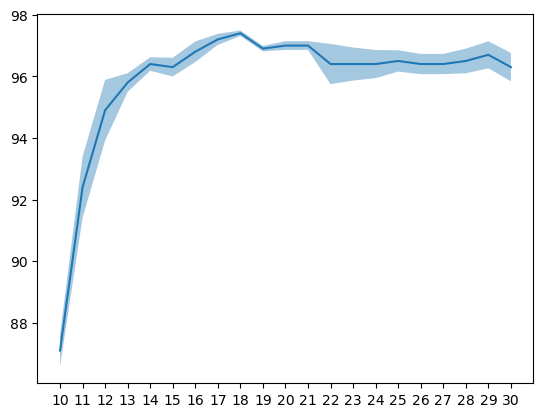

In [24]:
n_iter = 5
TEST_ACC = np.zeros((n_iter, num_queries+1))

print_acc = False
plot = True

sampling_strat = 'random'

for i in range(n_iter):
    print(f'ITER: {i+1:2d}')
    torch.manual_seed(i)
    # reset dataset, model and optimizer
    traindata.reset_mask()
    model = MLP(drop_out=drop_out)
    optimizer = optim.Adam(model.parameters(), lr = lr)
    
    # train on initial pool
    traindata.update_mask(init_pool_idx)
    labeled_loader = DataLoader(traindata, batch_size=batch_size, num_workers=0,
                                    sampler=SubsetRandomSampler(init_pool_idx), shuffle = False)

    model = train(model, labeled_loader, optimizer, device, num_epochs=300, plot = False, printout = False)
    TEST_ACC[i,0] = test(model, test_loader, device, display = False)

    for query in range(num_queries):
        # quering data points
        if sampling_strat == 'bald':
            sample_idx, scores, all_scores, Xs = query_the_oracle(model, traindata, device, query_strategy=sampling_strat, query_size=query_size, T = T, batch_size=batch_size)
        else:
            sample_idx = query_the_oracle(model, traindata, device, query_strategy=sampling_strat, query_size=query_size, T = T, batch_size=batch_size)
        
        traindata.update_mask(sample_idx)
        labeled_idx = np.where(traindata.unlabeled_mask == 0)[0]
        labeled_loader = DataLoader(traindata, batch_size=batch_size, num_workers=0,
                                    sampler=SubsetRandomSampler(labeled_idx), shuffle=False)

        # train model
        model = train(model,labeled_loader,optimizer, device, num_epochs=num_epochs, plot = False, printout = False)

        # test model
        test_acc = test(model, test_loader, device, display = False)
        TEST_ACC[i,query+1] = test_acc
        
        std = TEST_ACC.std(0)/np.sqrt(n_iter)
        mean  = TEST_ACC.mean(0)

        if print_acc:
            print(f'# Samples: {init_pool_size + query*query_size:3d} | Test accururacy : {test_acc:.2f}%')

if plot:
    x = np.arange(init_pool_size, num_queries+init_pool_size+1, dtype=int)
    plt.plot(x, mean)
    plt.fill_between(x, mean+std, mean-std, alpha = 0.4)
    plt.xticks(x)
    plt.show()

### Active Learning w. different acquisition strategies

In [6]:
query_dict = {
    'bald': {'acc_mean': [], 'acc_se': []},
    'random': {'acc_mean': [], 'acc_se': []},
    'entropy': {'acc_mean': [], 'acc_se': []},
    'margin': {'acc_mean': [], 'acc_se': []}
}

## setup ##
save_dict = False
plot = True

n_iter = 5
TEST_ACC = np.zeros((n_iter, num_queries+1))

bald_method = 'ensemble'


# seed list
for s in strat_list:
    #torch.manual_seed(r)
    
    print(f'STRATEGY: {s}')
    for i in range(n_iter):
        print(f'ITER: {i+1:2d}')
        
        torch.manual_seed(i)
        # reset dataset model and optimizer
        traindata.reset_mask()
        model = MLP(drop_out=drop_out)
        optimizer = optim.Adam(model.parameters(), lr = lr)
        
        # train on initial pool
        traindata.update_mask(init_pool_idx)
        labeled_loader = DataLoader(traindata, batch_size=batch_size, num_workers=0,
                                        sampler=SubsetRandomSampler(init_pool_idx), shuffle = False)
    
        model = train(model, labeled_loader, optimizer, device, num_epochs=num_epochs, plot = False, printout = False)
        TEST_ACC[i,0] = test(model, test_loader, device, display = False)
    
        for query in range(num_queries):
            # quering data points
            if s == 'bald':
                sample_idx, scores, all_scores, Xs = query_the_oracle(model, traindata, device, query_strategy=s, query_size=query_size, T = T, batch_size=batch_size, method = bald_method)
            else:
                sample_idx = query_the_oracle(model, traindata, device, query_strategy=s, query_size=query_size, T = T, batch_size=batch_size)
            
            traindata.update_mask(sample_idx)
            labeled_idx = np.where(traindata.unlabeled_mask == 0)[0]
            labeled_loader = DataLoader(traindata, batch_size=batch_size, num_workers=0,
                                        sampler=SubsetRandomSampler(labeled_idx), shuffle=False)

            # train model
            model = train(model,labeled_loader,optimizer, device, num_epochs=num_epochs, plot = False, printout = False)

            # test model
            test_acc = test(model, test_loader, device, display = False)
            TEST_ACC[i,query+1] = test_acc

            print(f'# Samples: {init_pool_size + query*query_size:3d} | Test accururacy : {test_acc:.2f}%')

    query_dict[s]['acc_se'] = TEST_ACC.std(0)/np.sqrt(n_iter)
    query_dict[s]['acc_mean']  = TEST_ACC.mean(0)
    
if save_dict:
    with open("QUERY_DICT_50", "wb") as fp:
        pickle.dump(query_dict, fp)

if plot:
    x = np.arange(init_pool_size,num_queries+init_pool_size+1,dtype=int)
    plt.figure(figsize=(10,6))

    for s in strat_list:
        mean = query_dict[s]['acc_mean']
        std = query_dict[s]['acc_se']
        plt.plot(x, mean, label = s)
        plt.legend()
        plt.title('Performance of Active Learning w. Different Acquisition Strategies')
        plt.xlabel('Number of Traning Points')
        plt.ylabel('Test Accuracy (%)')
        plt.xticks(x, x)
        plt.fill_between(x, mean+std, mean-std, alpha = 0.4)
    plt.savefig('reports/figures/TwoMoons_results_13.png')
    plt.show()

STRATEGY: random
ITER:  1
# Samples:  10 | Test accururacy : 84.50%
# Samples:  20 | Test accururacy : 93.50%
# Samples:  30 | Test accururacy : 94.00%
# Samples:  40 | Test accururacy : 93.00%
# Samples:  50 | Test accururacy : 94.00%
# Samples:  60 | Test accururacy : 94.00%
# Samples:  70 | Test accururacy : 93.50%
# Samples:  80 | Test accururacy : 94.00%
# Samples:  90 | Test accururacy : 95.00%
# Samples: 100 | Test accururacy : 95.50%
# Samples: 110 | Test accururacy : 95.50%
# Samples: 120 | Test accururacy : 96.00%
# Samples: 130 | Test accururacy : 96.50%
# Samples: 140 | Test accururacy : 97.00%
# Samples: 150 | Test accururacy : 97.50%
# Samples: 160 | Test accururacy : 96.50%
# Samples: 170 | Test accururacy : 97.00%
# Samples: 180 | Test accururacy : 97.00%
# Samples: 190 | Test accururacy : 96.50%
# Samples: 200 | Test accururacy : 97.50%
ITER:  2
# Samples:  10 | Test accururacy : 84.50%
# Samples:  20 | Test accururacy : 95.50%
# Samples:  30 | Test accururacy : 97.00%

KeyboardInterrupt: 

### Plot decision boundary for the different acquisition strategies

calculating: random
calculating: margin
calculating: entropy
calculating: bald


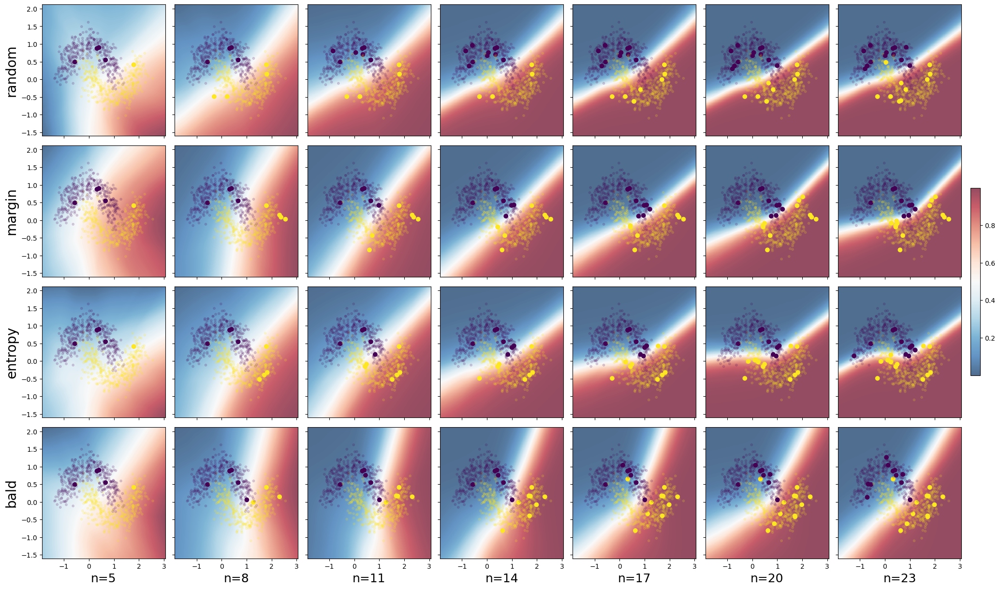

In [ ]:
lr = 1e-4
num_queries = 6
query_size = 3


mesh_alpha = 0.7

# figure init
fig, axs = plt.subplots(nrows=len(strat_list), ncols=num_queries+1, figsize=(20, 12),sharex=True, sharey=True)


for i, s in enumerate(strat_list):
    print(f'calculating: {s}')
    j = 0
    
    # reset dataset, model and optimizer
    traindata.reset_mask()
    model = MLP(drop_out=drop_out)
    optimizer = optim.Adam(model.parameters(), lr = lr)
    
    # train on initial pool
    traindata.update_mask(init_pool_idx)
    labeled_loader = DataLoader(traindata, batch_size=batch_size, num_workers=0,
                                        sampler=SubsetRandomSampler(init_pool_idx), shuffle = False)
    
    model = train(model, labeled_loader, optimizer, device, num_epochs=num_epochs, plot = False, printout = False)
    
    # plot initial 10 data points, first col in plot
    X, y, xx, yy, softmax_out = softmax_grid(model, X_train, y_train)
    
    mesh = axs[i,0].pcolormesh(xx, yy, softmax_out, cmap=plt.cm.RdBu_r, alpha = mesh_alpha)
    axs[i,0].scatter(X[init_pool_idx,0], X[init_pool_idx,1], c= y[init_pool_idx])
    axs[i,0].scatter(X[:,0], X[:,1], c = y, s = 40, alpha = 0.15, marker = '.')
    axs[i,0].set_xlim(X[:,0].min()-0.5, X[:,0].max()+0.5)
    axs[i,0].set_ylim(X[:,1].min()-0.5, X[:,1].max()+0.5)
    
    labeled_idx_list = []
    
    for query in range(num_queries):
        # quering data points
        if s == 'bald':
            sample_idx, scores, all_scores, Xs = query_the_oracle(model, traindata, device, query_strategy=s, query_size=query_size, T = T, batch_size=batch_size)
        else:
            sample_idx = query_the_oracle(model, traindata, device, query_strategy=s, query_size=query_size, T = T, batch_size=batch_size)
        
        traindata.update_mask(sample_idx)
        labeled_idx = np.where(traindata.unlabeled_mask == 0)[0]
        labeled_idx_list.extend(sample_idx)
                
        # define a list for plotting the initial pool + the queried points
        plot_idx = init_pool_idx + labeled_idx_list      
                
        labeled_loader = DataLoader(traindata, batch_size=batch_size, num_workers=0,
                                        sampler=SubsetRandomSampler(labeled_idx), shuffle = False)

        # train model
        model = train(model, labeled_loader, optimizer, device, num_epochs=num_epochs, plot = False, printout = False)
        
        
        X, y, xx, yy, softmax_out = softmax_grid(model, X_train, y_train)
        mesh = axs[i,j+1].pcolormesh(xx, yy, softmax_out, cmap=plt.cm.RdBu_r, alpha = mesh_alpha)
        axs[i,j+1].scatter(X[plot_idx,0], X[plot_idx,1], c = y[plot_idx])
        axs[i,j+1].scatter(X[:,0], X[:,1], c=y, s = 40, alpha = 0.15, marker = '.')
        axs[i,j+1].set_xlim(X[:,0].min()-0.5, X[:,0].max()+0.5)
        axs[i,j+1].set_ylim(X[:,1].min()-0.5, X[:,1].max()+0.5)
        
        j = j +1

fig.tight_layout()
fig.colorbar(mesh, ax=axs.ravel().tolist(), fraction=0.01, pad=0.01)

# set ylabels to strategy
for i, strat in enumerate(strat_list):
    axs[i,0].set_ylabel(strat, fontsize=20)

# set xlabels to number of sampled data points.
ns = np.linspace(0, query_size*num_queries, num_queries+1, dtype=int)

for i, n in enumerate(ns):
    axs[len(strat_list)-1,i].set_xlabel(f'n={int(init_pool_size+n)}', fontsize=18)

plt.savefig(FIGURE_PATH+'dec_bound_10.png')
plt.show()

### Plotting acquisition function output

##### ENTROPY

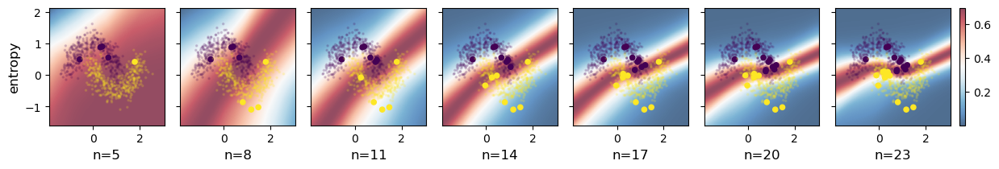

In [ ]:
model = MLP(drop_out=drop_out)

plot_acquisition_output(model,
                        traindata,
                        X_train,
                        y_train, 
                        entropy_grid, 
                        init_pool_idx, 
                        device,  
                        strategy = 'entropy',
                        num_epochs = num_epochs, 
                        batch_size = batch_size,
                        num_queries=6, 
                        query_size=3, 
                        lr =1e-4,
                        save_name = 'ent_0')

Dropout: 0.50


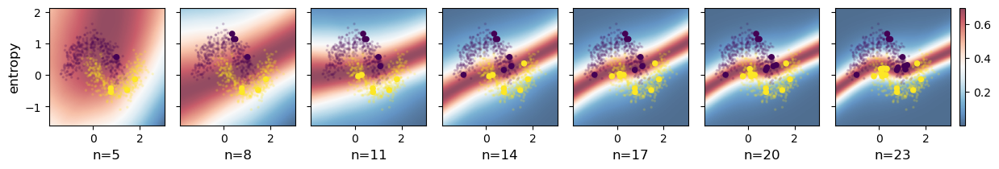

Dropout: 0.40


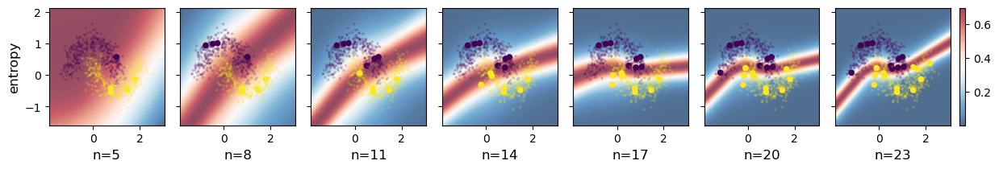

Dropout: 0.30


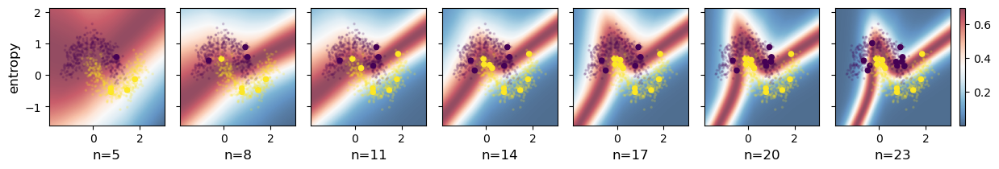

Dropout: 0.20


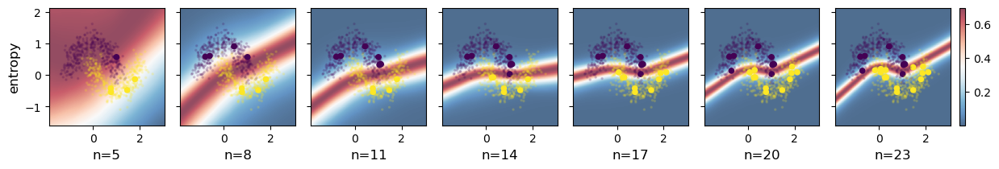

Dropout: 0.10


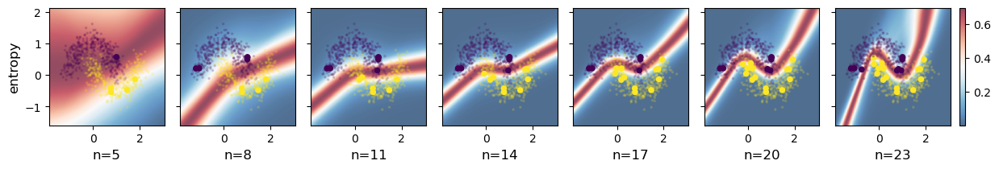

In [ ]:
ds = [0.5, 0.4, 0.3, 0.2, 0.1]

for d in ds:
    print(f'Dropout: {d:.2f}')
    model = MLP(drop_out=d)
    plot_acquisition_output(model,
                            traindata,
                            X_train,
                            y_train, 
                            entropy_grid, 
                            init_pool_idx, 
                            device,  
                            strategy = 'entropy',
                            num_epochs = num_epochs, 
                            batch_size = batch_size,
                            num_queries=6, 
                            query_size=3, 
                            lr =1e-4,
                            save_name = 'ent_'+str(d))

##### BALD

In [ ]:
model = MLP(drop_out=0.5)

plot_acquisition_output(model, 
                        traindata,
                        X_train,
                        y_train,
                        BALD_grid, 
                        init_pool_idx, 
                        device, 
                        strategy = 'bald',
                        num_epochs = num_epochs, 
                        batch_size = batch_size, 
                        num_queries=6, 
                        query_size=3, 
                        lr =1e-4,
                        train_T = 10,
                        plot_T = 100,
                        save_name = 'bald_0')

: 

: 

Dropout: 0.50


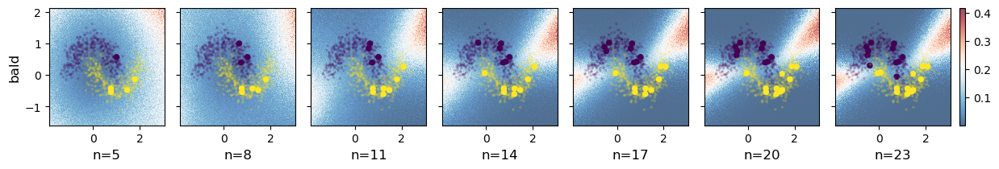

Dropout: 0.40


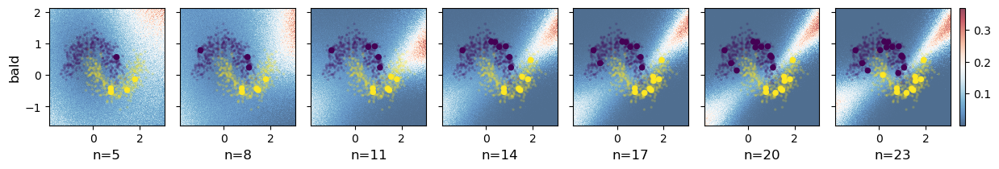

Dropout: 0.30


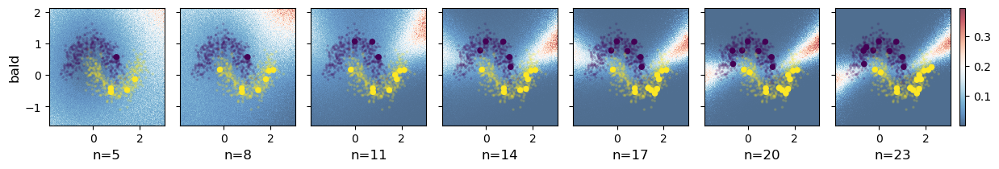

Dropout: 0.20


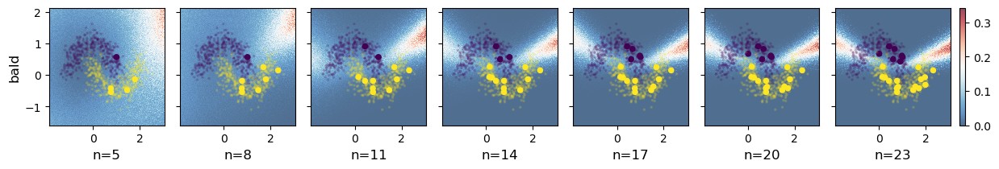

Dropout: 0.10


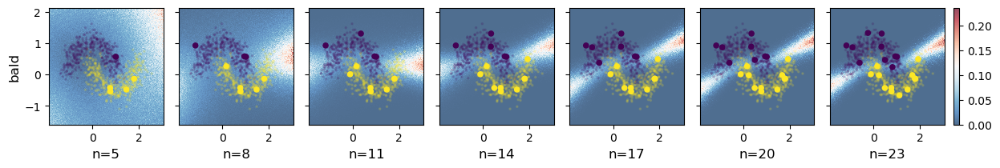

In [ ]:
ds = [0.5, 0.4, 0.3, 0.2, 0.1]

for d in ds:
    print(f'Dropout: {d:.2f}')
    model = MLP(drop_out=d)
    plot_acquisition_output(model, 
                        traindata,
                        X_train,
                        y_train,
                        BALD_grid, 
                        init_pool_idx, 
                        device, 
                        strategy = 'bald',
                        num_epochs = num_epochs, 
                        batch_size = batch_size, 
                        num_queries=6, 
                        query_size=3, 
                        lr =1e-4,
                        T = 100,
                        save_name = 'bald_'+str(d))

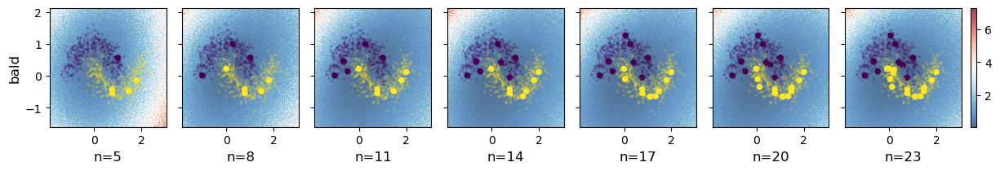

In [ ]:
model = MLP(drop_out=0.5)

plot_acquisition_output(model, 
                        traindata,
                        X_train,
                        y_train,
                        var_grid, 
                        init_pool_idx, 
                        device, 
                        strategy = 'bald',
                        num_epochs = num_epochs, 
                        batch_size = batch_size, 
                        num_queries=6, 
                        query_size=3, 
                        lr =1e-4,
                        plot_T = 100,
                        train_T = 100,
                        save_name = 'var_0')

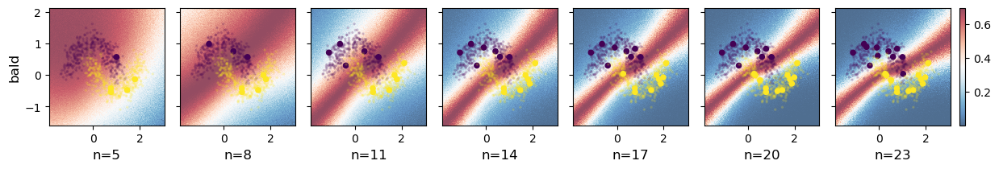

In [ ]:
model = MLP(drop_out=0.5)

plot_acquisition_output(model, 
                        traindata,
                        X_train,
                        y_train,
                        BALD_1_grid, 
                        init_pool_idx, 
                        device, 
                        strategy = 'bald',
                        num_epochs = num_epochs, 
                        batch_size = batch_size, 
                        num_queries=6, 
                        query_size=3, 
                        lr =1e-4,
                        plot_T = 100,
                        train_T = 100,
                        save_name = 'bald1_0')

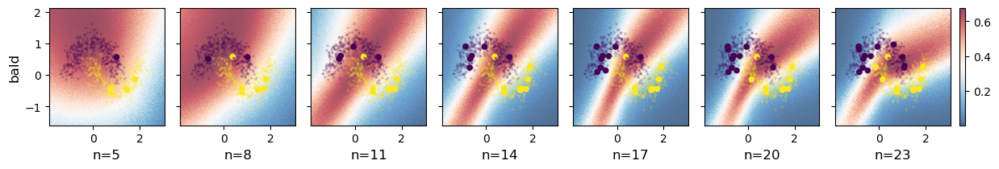

In [ ]:
model = MLP(drop_out=0.5)

plot_acquisition_output(model, 
                        traindata,
                        X_train,
                        y_train,
                        BALD_2_grid, 
                        init_pool_idx, 
                        device, 
                        strategy = 'bald',
                        num_epochs = num_epochs, 
                        batch_size = batch_size, 
                        num_queries=6, 
                        query_size=3, 
                        lr =1e-4,
                        plot_T = 100,
                        train_T = 100,
                        save_name = 'bald2_0')

// Query  1 of size 10
// Query  2 of size 10
// Query  3 of size 10
// Query  4 of size 10
// Query  5 of size 10


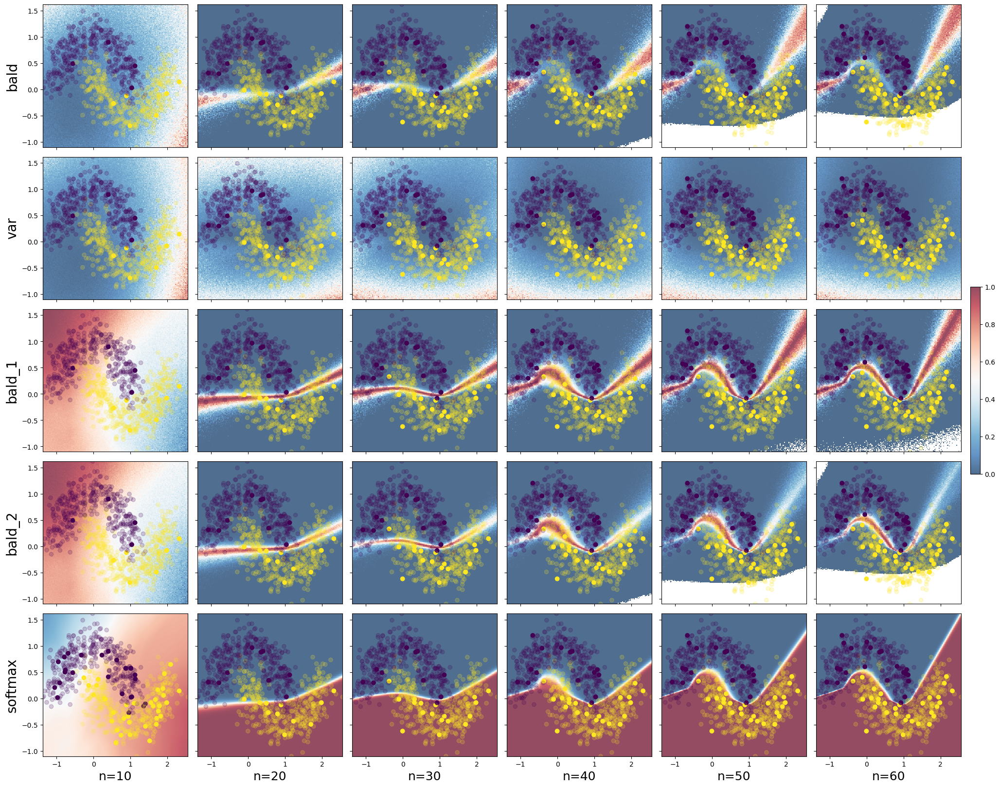

In [67]:
lr = 6e-4
num_queries = 5
query_size = 10

mesh_alpha = 0.7

sorted_pool_list = []
bald_out_list = []
labeled_idx_list = []

T = 100
bald_method = 'MC_drop'

label_list = ['bald', 'var', 'bald_1', 'bald_2', 'softmax']

# figure init
fig, axs = plt.subplots(nrows=len(label_list), ncols=num_queries+1, figsize=(20, 16),sharex=True, sharey=True)

# reset dataset, model and optimizer
traindata.reset_mask()
model = MLP(drop_out=drop_out)
optimizer = optim.Adam(model.parameters(), lr = lr)

# plot initial 10 data points, first col in plot
xx, yy, grids_list = BALD_grid_viz(model, X_train, y_train, T = T)
xx_soft, yy_soft, softmax_out = softmax_grid(model, X_train, y_train)

for i, g in enumerate(grids_list):
    mesh = axs[i,0].pcolormesh(xx, yy, g, cmap=plt.cm.RdBu_r, alpha = mesh_alpha)
    axs[i,0].scatter(X_train[init_pool_idx,0], X_train[init_pool_idx,1], c= y_train[init_pool_idx])
    axs[i,0].scatter(X_train[:,0], X_train[:,1], c = y_train, alpha = 0.2)
    axs[i,0].set_xlim(X_train[:,0].min(), X_train[:,0].max())
    axs[i,0].set_ylim(X_train[:,1].min(), X_train[:,1].max())
    
mesh = axs[4,0].pcolormesh(xx_soft, yy_soft, softmax_out, cmap=plt.cm.RdBu_r, alpha = mesh_alpha)
axs[4,0].scatter(X_train[plot_idx,0], X_train[plot_idx,1], c = y_train[plot_idx])
axs[4,0].scatter(X_train[:,0], X_train[:,1], c = y_train, alpha = 0.2)
axs[4,0].set_xlim(X_train[:,0].min(), X_train[:,0].max())
axs[4,0].set_ylim(X_train[:,1].min(), X_train[:,1].max())


# train on initial pool
traindata.update_mask(init_pool_idx)
labeled_loader = DataLoader(traindata, batch_size=batch_size, num_workers=0,
                                    sampler=SubsetRandomSampler(init_pool_idx), shuffle = False)

model = train(model, labeled_loader, optimizer, device, num_epochs=num_epochs, plot = False, printout = False)

for j, query in enumerate(range(num_queries)):
    print(f'// Query {j+1:2d} of size {query_size}')
    
    # quering data points
    sample_idx, scores, sorted_pool, Xs = query_the_oracle(model, traindata, device, query_strategy='bald', bald_method =  bald_method, query_size=query_size, batch_size=batch_size, T = T)
    sorted_pool_list.append(sorted_pool)
    
    #print(f'...with BALD scores: \n {scores}')
    #print(f'...and coordinates : \n {Xs}')
    
    traindata.update_mask(sample_idx)
    labeled_idx = np.where(traindata.unlabeled_mask == 0)[0]
    labeled_idx_list.extend(sample_idx)
                
    # define a list for plotting the initial pool + the queried points
    plot_idx = init_pool_idx + labeled_idx_list    

            
    labeled_loader = DataLoader(traindata, batch_size=batch_size, num_workers=0,
                                    sampler=SubsetRandomSampler(labeled_idx), shuffle = False)
    
    
    
     # plot
    xx, yy, grids_list = BALD_grid_viz(model, X_train, y_train, T = T)
    xx_soft, yy_soft, softmax_out = softmax_grid(model, X_train, y_train)
    
    bald_out_list.append(grids_list[0])
    
    for k, g in enumerate(grids_list):
        mesh = axs[k,j+1].pcolormesh(xx, yy, g, cmap=plt.cm.RdBu_r, alpha = mesh_alpha)
        axs[k,j+1].scatter(X_train[plot_idx,0], X_train[plot_idx,1], c = y_train[plot_idx])
        axs[k,j+1].scatter(X_train[:,0], X_train[:,1], c = y_train, alpha = 0.2)
        axs[k,j+1].set_xlim(X_train[:,0].min(), X_train[:,0].max())
        axs[k,j+1].set_ylim(X_train[:,1].min(), X_train[:,1].max())
    
    mesh = axs[4,j+1].pcolormesh(xx_soft, yy_soft, softmax_out, cmap=plt.cm.RdBu_r, alpha = mesh_alpha)
    axs[4,j+1].scatter(X_train[plot_idx,0], X_train[plot_idx,1], c = y_train[plot_idx])
    axs[4,j+1].scatter(X_train[:,0], X_train[:,1], c = y_train, alpha = 0.2)
    axs[4,j+1].set_xlim(X_train[:,0].min(), X_train[:,0].max())
    axs[4,j+1].set_ylim(X_train[:,1].min(), X_train[:,1].max())
    
    
    # train model
    optimizer = optim.Adam(model.parameters(), lr = lr)
    model = train(model, labeled_loader, optimizer, device, num_epochs=num_epochs, plot = False, printout = False)


fig.tight_layout()
fig.colorbar(mesh, ax=axs.ravel().tolist(), fraction=0.01, pad=0.01)

# set ylabels to strategy
for i, label in enumerate(label_list):
    axs[i,0].set_ylabel(label, fontsize=20)

# set xlabels to number of sampled data points.
ns = np.linspace(0, query_size*num_queries, num_queries+1, dtype=int)

for i, n in enumerate(ns):
    axs[len(label_list)-1,i].set_xlabel(f'n={int(init_pool_size+n)}', fontsize=18)

plt.savefig(FIGURE_PATH+'bald_viz_3.png')
plt.show()

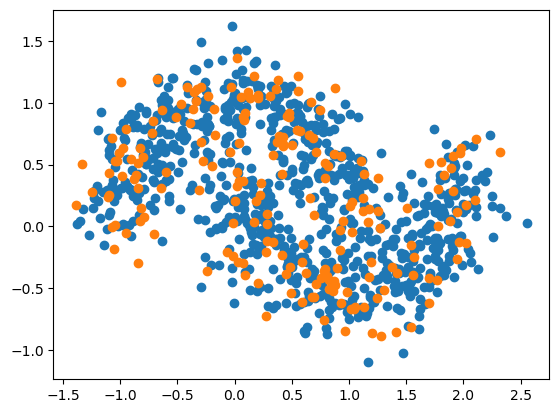

In [82]:
plt.scatter(X_train[:,0], X_train[:,1])
plt.scatter(X_test[:,0], X_test[:,1])

Epoch:   0 | Train Loss: 0.69 | Train Acc: 47.5%
Epoch:   1 | Train Loss: 0.69 | Train Acc: 49.0%
Epoch:   2 | Train Loss: 0.68 | Train Acc: 50.5%
Epoch:   3 | Train Loss: 0.67 | Train Acc: 50.5%
Epoch:   4 | Train Loss: 0.67 | Train Acc: 54.0%
Epoch:   5 | Train Loss: 0.66 | Train Acc: 56.5%
Epoch:   6 | Train Loss: 0.65 | Train Acc: 59.5%
Epoch:   7 | Train Loss: 0.65 | Train Acc: 60.0%
Epoch:   8 | Train Loss: 0.65 | Train Acc: 64.0%
Epoch:   9 | Train Loss: 0.64 | Train Acc: 64.0%
Epoch:  10 | Train Loss: 0.64 | Train Acc: 71.5%
Epoch:  11 | Train Loss: 0.64 | Train Acc: 68.5%
Epoch:  12 | Train Loss: 0.63 | Train Acc: 78.0%
Epoch:  13 | Train Loss: 0.63 | Train Acc: 78.0%
Epoch:  14 | Train Loss: 0.62 | Train Acc: 79.5%
Epoch:  15 | Train Loss: 0.62 | Train Acc: 82.0%
Epoch:  16 | Train Loss: 0.62 | Train Acc: 82.5%
Epoch:  17 | Train Loss: 0.61 | Train Acc: 83.5%
Epoch:  18 | Train Loss: 0.61 | Train Acc: 85.0%
Epoch:  19 | Train Loss: 0.60 | Train Acc: 85.0%
Epoch:  20 | Train L

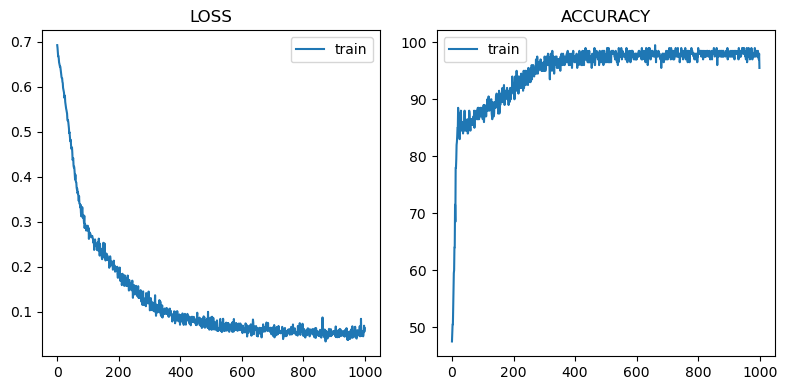

In [49]:
model = MLP(drop_out=drop_out)
optimizer = optim.Adam(model.parameters(), lr = lr)
model = train(model, test_loader, optimizer, device, num_epochs=1000, plot = True, printout = True)

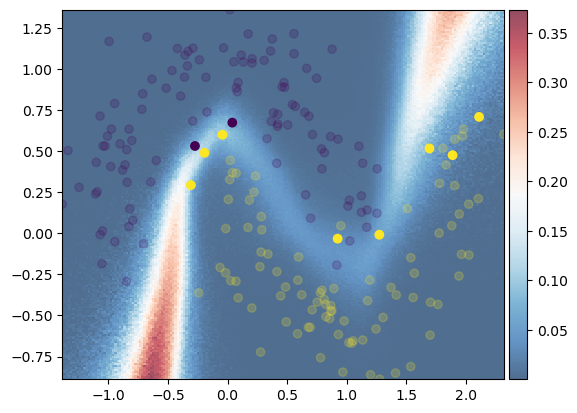

In [50]:
T = 1000
datalen = len(testdata)
idx, bald_scores, all_scores, Xs = BALD_query(model, device, test_loader, datalen, batch_size=batch_size, query_size=10, method='MC_drop')
xx, yy, grids_list = BALD_grid_viz(model, X_test, y_test, T = T)

mesh = plt.pcolormesh(xx, yy, grids_list[0], cmap=plt.cm.RdBu_r, alpha = mesh_alpha)
plt.colorbar(mesh, fraction=0.1, pad=0.01)
plt.scatter(X_test[idx,0], X_test[idx,1], c = y_test[idx])
plt.scatter(X_test[:,0], X_test[:,1], c = y_test, alpha = 0.2)
plt.xlim(X_test[:,0].min(), X_test[:,0].max())
plt.ylim(X_test[:,1].min(), X_test[:,1].max())
plt.show()


## BALD MC

NameError: name 'traindata' is not defined

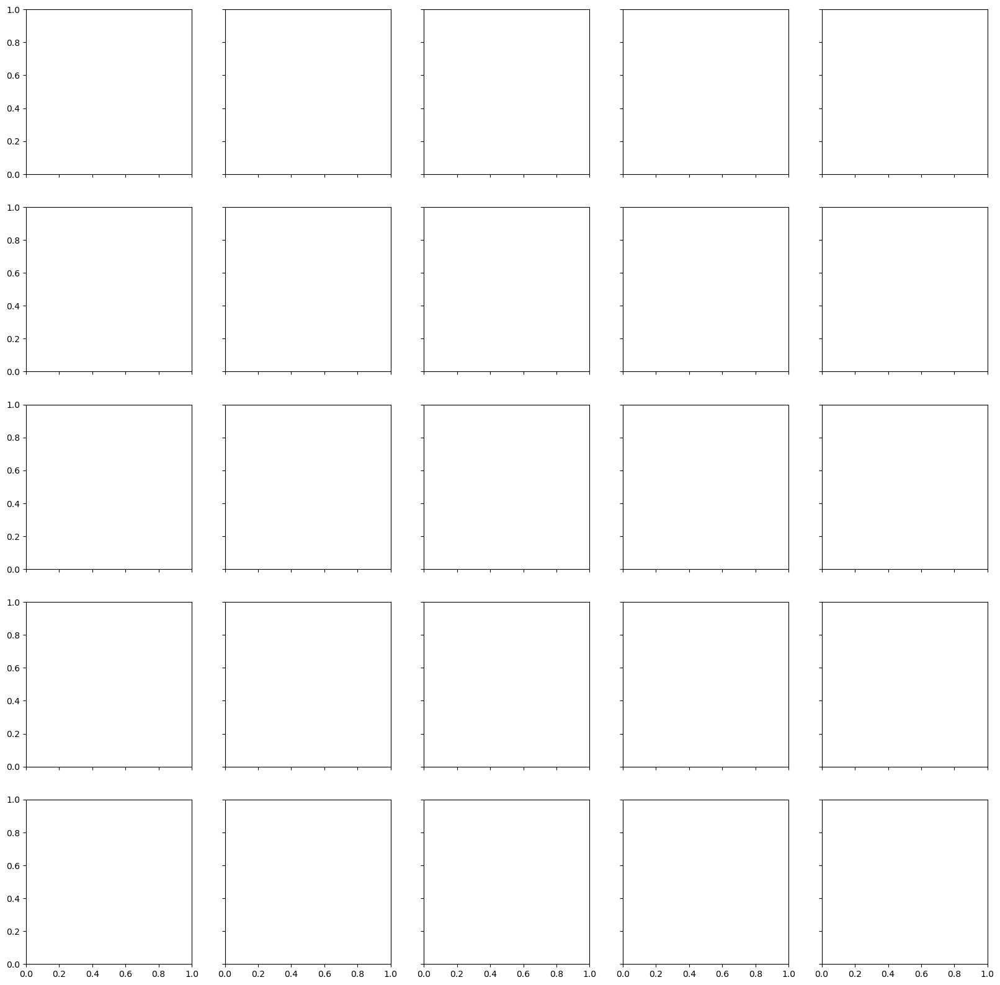

In [4]:
lr = 6e-4
num_queries = 4
query_size = 5

mesh_alpha = 0.7

T = 10
bald_method = 'ensemble'
labeled_idx_list = []

label_list = ['bald', 'var', 'bald_1', 'bald_2', 'softmax']

# figure init
fig, axs = plt.subplots(nrows=len(label_list), ncols=num_queries+1, figsize=(20, 20),sharex=True, sharey=True)

# reset dataset, model and optimizer
traindata.reset_mask()
model = MLP(drop_out=drop_out)
optimizer = optim.Adam(model.parameters(), lr = lr)

# plot initial 10 data points, first col in plot
xx, yy, grids_list = BALD_grid_viz(model, X_train, y_train, T = T)
xx_soft, yy_soft, softmax_out = softmax_grid(model, X_train, y_train)

for i, g in enumerate(grids_list):
    mesh = axs[i,0].pcolormesh(xx, yy, g, cmap=plt.cm.RdBu_r, alpha = mesh_alpha)
    axs[i,0].scatter(X_train[init_pool_idx,0], X_train[init_pool_idx,1], c= y_train[init_pool_idx])
    axs[i,0].scatter(X_train[:,0], X_train[:,1], c = y_train, alpha = 0.1)
    axs[i,0].set_xlim(X_train[:,0].min(), X_train[:,0].max())
    axs[i,0].set_ylim(X_train[:,1].min(), X_train[:,1].max())
    
mesh = axs[4,0].pcolormesh(xx_soft, yy_soft, softmax_out, cmap=plt.cm.RdBu_r, alpha = mesh_alpha)
axs[4,0].scatter(X_train[init_pool_idx,0], X_train[init_pool_idx,1], c = y_train[init_pool_idx])
axs[4,0].scatter(X_train[:,0], X_train[:,1], c = y_train, alpha = 0.1)
axs[4,0].set_xlim(X_train[:,0].min(), X_train[:,0].max())
axs[4,0].set_ylim(X_train[:,1].min(), X_train[:,1].max())

# train on initial pool
traindata.update_mask(init_pool_idx)
labeled_loader = DataLoader(traindata, batch_size=batch_size, num_workers=0,
                                    sampler=SubsetRandomSampler(init_pool_idx), shuffle = False)

model = train(model, labeled_loader, optimizer, device, num_epochs=num_epochs, plot = False, printout = False)

for j, query in enumerate(range(num_queries)):
    print(f'// Query {j+1:2d} of size {query_size}')
    
    datalen = len(traindata)
    sample_idx, xx, yy, grids_list = BALD_query(model, device, train_loader, datalen, X_train, y_train, batch_size=batch_size, query_size=query_size, method=bald_method)
    traindata.update_mask(sample_idx)
    labeled_idx = np.where(traindata.unlabeled_mask == 0)[0]
    labeled_idx_list.extend(sample_idx)
    
    plot_idx = init_pool_idx + labeled_idx_list

    #xx, yy, grids_list = BALD_grid_viz(model, X_train, y_train, T = T)
    xx_soft, yy_soft, softmax_out = softmax_grid(model, X_train, y_train)

    for k, g in enumerate(grids_list):
        mesh = axs[k,j+1].pcolormesh(xx, yy, g, cmap=plt.cm.RdBu_r, alpha = mesh_alpha)
        axs[k,j+1].scatter(X_train[plot_idx,0], X_train[plot_idx,1], c = y_train[plot_idx])
        axs[k,j+1].scatter(X_train[:,0], X_train[:,1], c = y_train, alpha = 0.1)
        axs[k,j+1].set_xlim(X_train[:,0].min(), X_train[:,0].max())
        axs[k,j+1].set_ylim(X_train[:,1].min(), X_train[:,1].max())
    
    mesh = axs[4,j+1].pcolormesh(xx_soft, yy_soft, softmax_out, cmap=plt.cm.RdBu_r, alpha = mesh_alpha)
    axs[4,j+1].scatter(X_train[plot_idx,0], X_train[plot_idx,1], c = y_train[plot_idx])
    axs[4,j+1].scatter(X_train[:,0], X_train[:,1], c = y_train, alpha = 0.1)
    axs[4,j+1].set_xlim(X_train[:,0].min(), X_train[:,0].max())
    axs[4,j+1].set_ylim(X_train[:,1].min(), X_train[:,1].max())
    
    labeled_loader = DataLoader(traindata, batch_size=batch_size, num_workers=0,
                                    sampler=SubsetRandomSampler(labeled_idx), shuffle = False)
    
    optimizer = optim.Adam(model.parameters(), lr = lr)
    model = train(model, labeled_loader, optimizer, device, num_epochs=num_epochs, plot = False, printout = False)

fig.colorbar(mesh, ax=axs.ravel().tolist(), fraction=0.01, pad=0.01)

# set ylabels to strategy
for i, label in enumerate(label_list):
    axs[i,0].set_ylabel(label, fontsize=20)

# set xlabels to number of sampled data points.
ns = np.linspace(0, query_size*num_queries, num_queries+1, dtype=int)

for i, n in enumerate(ns):
    axs[len(label_list)-1,i].set_xlabel(f'n={int(init_pool_size+n)}', fontsize=18)

plt.savefig(FIGURE_PATH+'bald_viz_2.png')
plt.show()

## BALD Ensemble

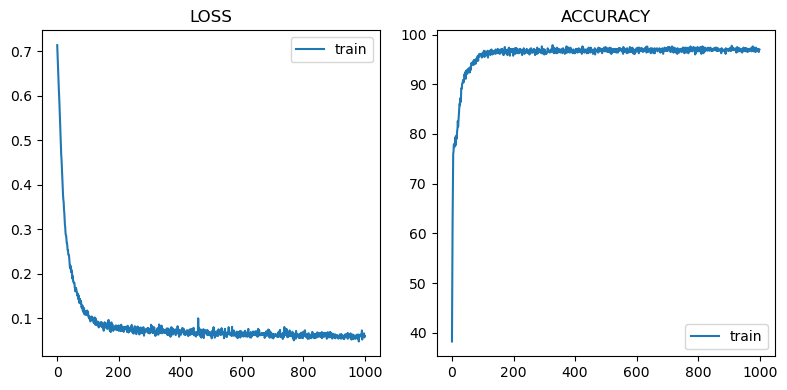

In [52]:
model = MLP(drop_out=drop_out)
optimizer = optim.Adam(model.parameters(), lr = lr)
model = train(model, train_loader, optimizer, device, num_epochs=1000, plot = True, printout = False)

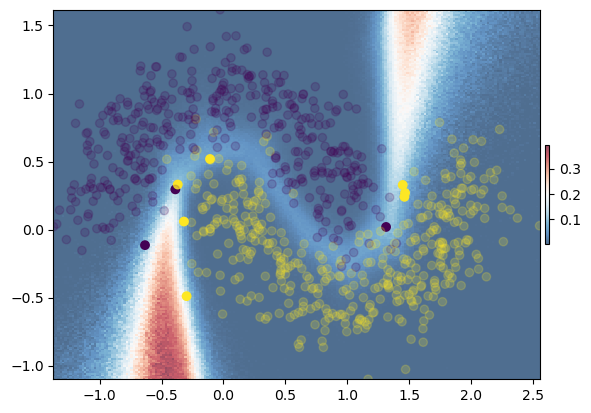

In [55]:
datalen = len(traindata)
idx, bald_scores, all_scores, Xs = BALD_query(model, device, train_loader, datalen, batch_size=batch_size, query_size=10, method='MC_drop')
xx, yy, grids_list = BALD_grid_viz(model, X_train, y_train, T = T)

mesh = plt.pcolormesh(xx, yy, grids_list[0], cmap=plt.cm.RdBu_r, alpha = mesh_alpha)
plt.colorbar(mesh, fraction=0.01, pad=0.01)
plt.scatter(X_train[idx,0], X_train[idx,1], c = y_train[idx])
plt.scatter(X_train[:,0], X_train[:,1], c = y_train, alpha = 0.2)
plt.xlim(X_train[:,0].min(), X_train[:,0].max())
plt.ylim(X_train[:,1].min(), X_train[:,1].max())
plt.show()

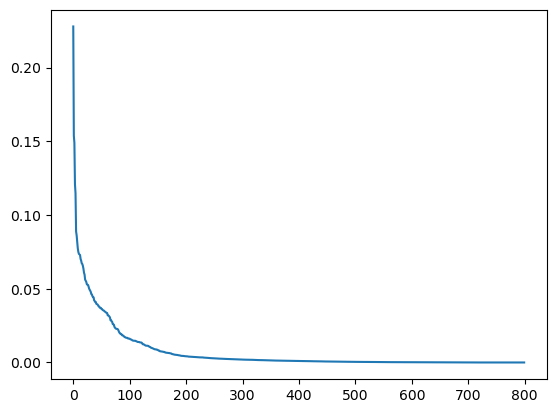

In [54]:
plt.plot(all_scores)

//Query 1 
 BALD scores unlabeled pool


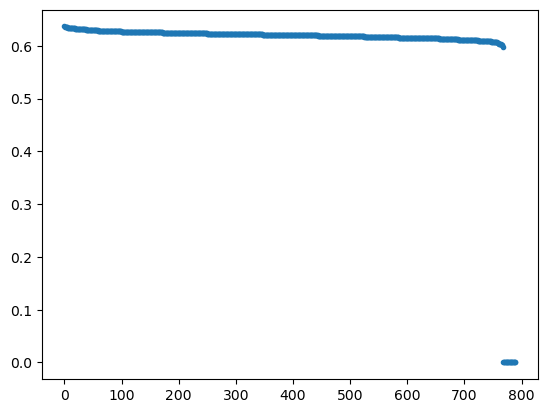

//Query 2 
 BALD scores unlabeled pool


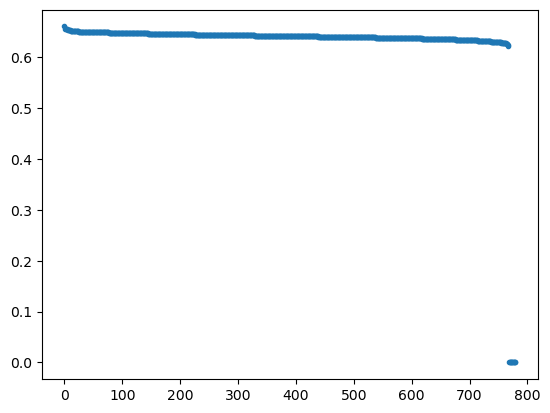

//Query 3 
 BALD scores unlabeled pool


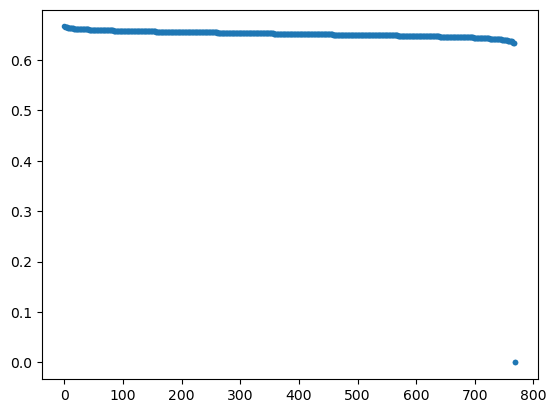

//Query 4 
 BALD scores unlabeled pool


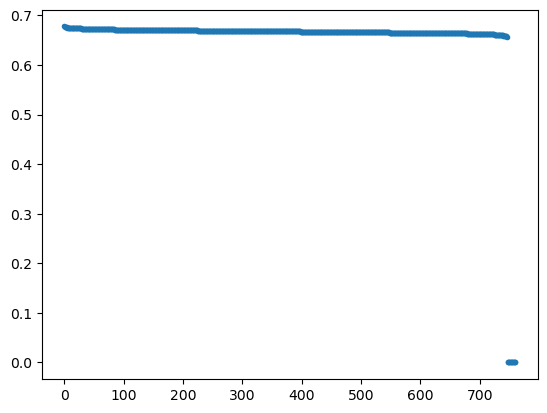

//Query 5 
 BALD scores unlabeled pool


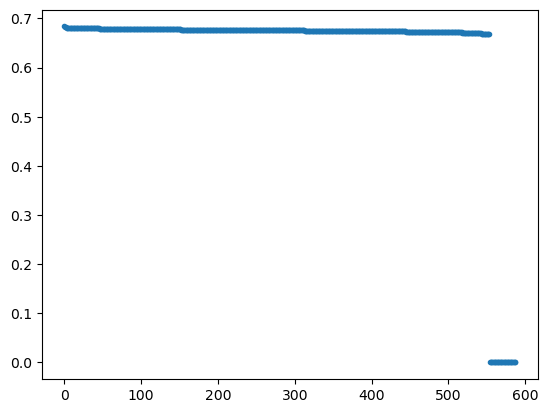

In [33]:
for i in range(5):
    print(f'//Query {i+1} \n BALD scores unlabeled pool')
    plt.plot(sorted_pool_list[i], '.')
    plt.show()

//Query 1 
 BALD scores unlabeled pool


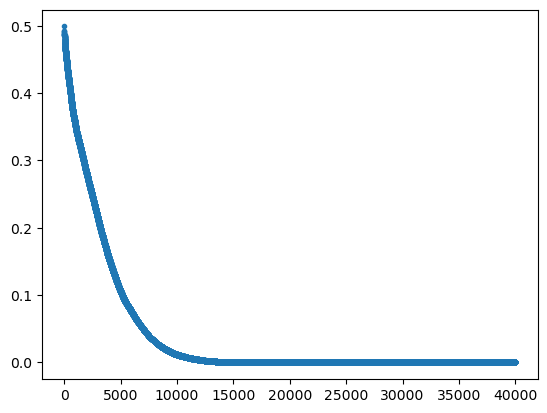

//Query 2 
 BALD scores unlabeled pool


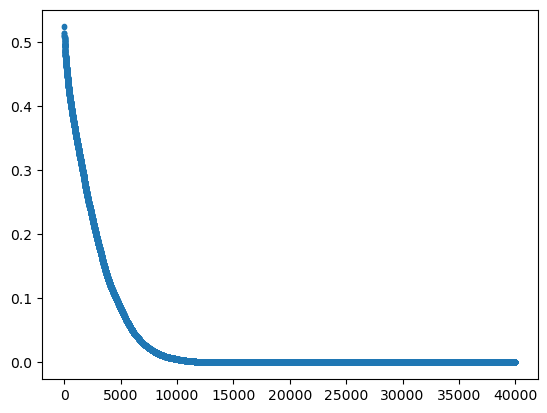

//Query 3 
 BALD scores unlabeled pool


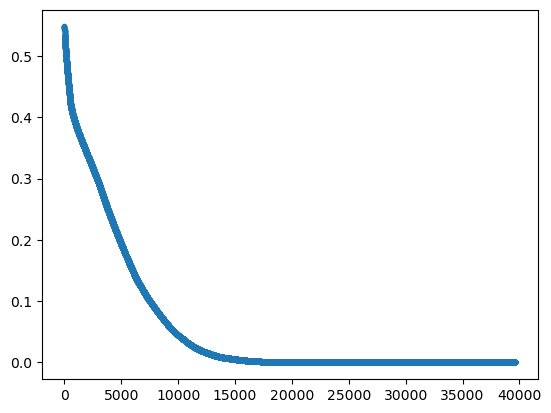

//Query 4 
 BALD scores unlabeled pool


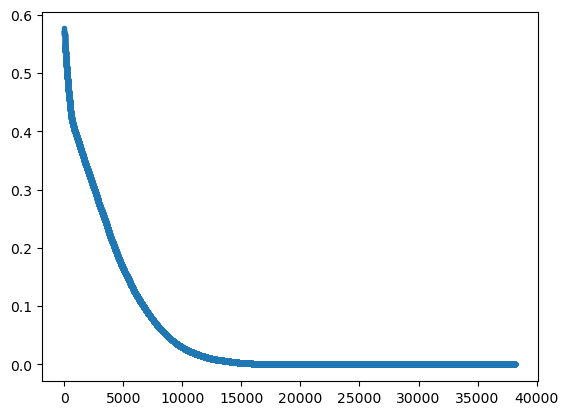

//Query 5 
 BALD scores unlabeled pool


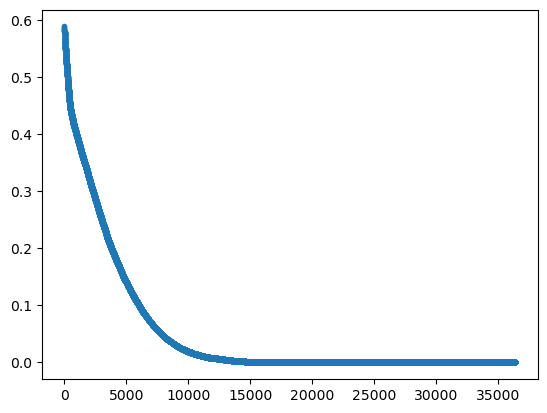

In [34]:
for i in range(5):
    print(f'//Query {i+1} \n BALD scores unlabeled pool')
    sorted_grid_idx = np.argsort(-1*bald_out_list[i].flatten())
    plot = bald_out_list[i].flatten()[sorted_grid_idx]
    plt.plot(plot, '.')
    plt.show()

// Query  1 of size 10
// Query  2 of size 10
// Query  3 of size 10
// Query  4 of size 10
// Query  5 of size 10


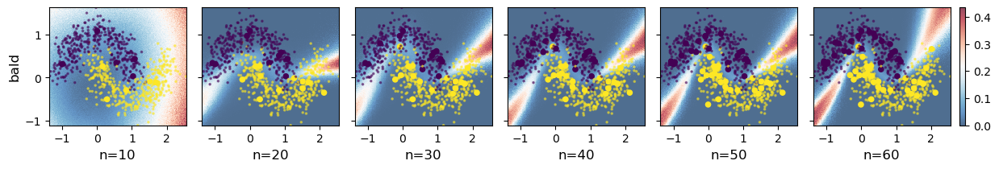

In [35]:
lr = 1e-4
num_queries = 5
query_size = 10

mesh_alpha = 0.7

sorted_pool_list = []
bald_out_list = []

T = 1000

label_list = ['bald' ]

# figure init
fig, axs = plt.subplots(nrows=len(label_list), ncols=num_queries+1, figsize=(12, 2),sharex=True, sharey=True)

# reset dataset, model and optimizer
traindata.reset_mask()
model = MLP(drop_out=drop_out)
optimizer = optim.Adam(model.parameters(), lr = lr)

# train on initial pool
traindata.update_mask(init_pool_idx)
labeled_loader = DataLoader(traindata, batch_size=batch_size, num_workers=0,
                                    sampler=SubsetRandomSampler(init_pool_idx), shuffle = False)


# plot initial 10 data points, first col in plot
xx, yy, bald_out, var_out, bald_1_out, bald_2_out = BALD_grid_viz(model, X_train, y_train, T = T)

model = train(model, labeled_loader, optimizer, device, num_epochs=num_epochs, plot = False, printout = False)


mesh = axs[0].pcolormesh(xx, yy, bald_out, cmap=plt.cm.RdBu_r, alpha = mesh_alpha)
axs[0].scatter(X_train[init_pool_idx,0], X_train[init_pool_idx,1], c= y_train[init_pool_idx], s = 20)
axs[0].scatter(X_train[:,0], X_train[:,1], c = y_train, s = 10, alpha = 0.5, marker = '.')
axs[0].set_xlim(X_train[:,0].min(), X_train[:,0].max())
axs[0].set_ylim(X_train[:,1].min(), X_train[:,1].max())


labeled_idx_list = []

for j, query in enumerate(range(num_queries)):
    print(f'// Query {j+1:2d} of size {query_size}')
    # quering data points
    sample_idx, scores, sorted_pool, Xs = query_the_oracle(model, traindata, device, query_strategy='bald', query_size=query_size, batch_size=batch_size, T = T)
    sorted_pool_list.append(sorted_pool)
    #print(f'...with BALD scores:\n {scores}')
    #print(f'...and coordinates :\n {Xs}')
    traindata.update_mask(sample_idx)
    labeled_idx = np.where(traindata.unlabeled_mask == 0)[0]
    labeled_idx_list.extend(sample_idx)
                
    # define a list for plotting the initial pool + the queried points
    
    #labeled_idx_list = sample_idx  
    plot_idx = init_pool_idx + labeled_idx_list    

            
    labeled_loader = DataLoader(traindata, batch_size=batch_size, num_workers=0,
                                    sampler=SubsetRandomSampler(labeled_idx), shuffle = False)

    # train model
    model = train(model, labeled_loader, optimizer, device, num_epochs=num_epochs, plot = False, printout = False)
    
    xx, yy, bald_out, var_out, bald_1_out, bald_2_out = BALD_grid_viz(model, X_train, y_train, T = T)
    
    bald_out_list.append(bald_out)

    
    mesh = axs[j+1].pcolormesh(xx, yy, bald_out, cmap=plt.cm.RdBu_r, alpha = mesh_alpha)
    axs[j+1].scatter(X_train[plot_idx,0], X_train[plot_idx,1], c = y_train[plot_idx], s = 20)
    axs[j+1].scatter(X_train[:,0], X_train[:,1], c = y_train, s = 10, alpha = 0.5, marker = '.')
    axs[j+1].set_xlim(X_train[:,0].min(), X_train[:,0].max())
    axs[j+1].set_ylim(X_train[:,1].min(), X_train[:,1].max())
    

fig.tight_layout()
fig.colorbar(mesh, ax=axs.ravel().tolist(), fraction=0.01, pad=0.01)

# set ylabels to strategy
axs[0].set_ylabel('bald', fontsize=12)

# set xlabels to number of sampled data points.
ns = np.linspace(0, query_size*num_queries, num_queries+1, dtype = int)

for i, n in enumerate(ns):
    axs[i].set_xlabel(f'n={int(len(init_pool_idx)+n)}', fontsize=12)

plt.savefig(FIGURE_PATH+'bald_viz_2.png')
plt.show()

TODO:
- log predictive density on test set, as an alternative measure to accuracy.


3 ways to go:
- Deep ensemles, better undertainty quant.
- GP.
- MNIST reproduce results.

Questions:
- New optimizer for each query?
- Grid for ensemble.
- Build AL loop from the single case above.

In [ ]:
idx, scores, all_scores, X = BALD_query(model, device, test_loader, batch_size=batch_size)

torch.Size([6000, 2])


IndexError: Dimension out of range (expected to be in range of [-2, 1], but got 2)

In [ ]:
X[idx]

array([[1.83381963, 0.41639033],
       [1.98066795, 0.63367432],
       [2.31838822, 0.60260695],
       [1.97109866, 0.59123832],
       [1.77859092, 0.30355692],
       [2.11098576, 0.70761818],
       [1.80646551, 0.51669115],
       [2.10513449, 0.21076077],
       [1.88843477, 0.47498602],
       [1.69472313, 0.51605111]])

In [ ]:
idx

array([ 41,  35, 132,  61,  14,  51,  50, 149, 134,   6])

### Laplace Approximation

In [ ]:
from laplace import Laplace

train_loader, test_loader = get_dataloaders(moons_data = moons_data, val_split = 0.2, batch_size=256, return_idx=False)

# Pre-trained model
model = MLP(drop_out=0.50)  

# User-specified LA flavor
la = Laplace(model, 'classification',
             subset_of_weights='all',
             hessian_structure='full')

la.fit(train_loader)

/Users/madsbirch/Documents/4_semester/BAL/bayesian-active-learning/env/lib/python3.8/site-packages/backpack/extensions/backprop_extension.py:106: UserWarning: Extension saving to grad_batch does not have an extension for Module <class 'src.models.model.MLP'> although the module has parameters
  warnings.warn(


In [ ]:
la.optimize_prior_precision(method='CV', val_loader=test_loader)

In [ ]:
la_samples = la.sample(n_samples = 1000)

In [ ]:
la_samples.shape

torch.Size([1000, 10602])

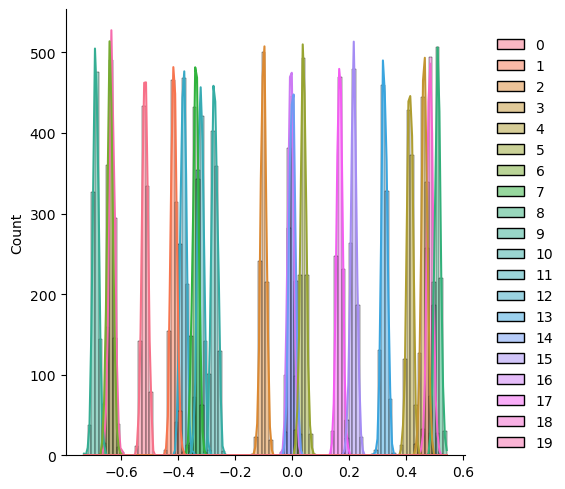

In [ ]:
post_weights = la.sample(1000).detach().cpu().numpy()
sns.displot(post_weights[:,:20], bins = 100, kde = True)
plt.show()